# Prototyping the best libraries for extracting DEM elevation for ICESat-2 Points
Compare Xarray vs Georasters and Geopandas vs Pandas  
Prefer: Xarray and Pandas as both can be easily run in Parallel using DASK jobqueue

And then Compare the difference in elevation between DEM and Icesat-2 Data
REMA  

In [33]:
%matplotlib inline

In [2]:
import os

import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (12, 7), 'font.size': 10})

from shapely.geometry import Polygon, Point
import hvplot
import geoviews as gv

import xarray as xr

import rasterio as rio
import hvplot.pandas
import hvplot.xarray

from dask.distributed import Client, LocalCluster

In [30]:
import hvplot.dask


In [3]:
cluster = LocalCluster(n_workers=20) #
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://127.0.0.1:40969 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 20 Cores: 20 Memory: 42.95 GB


In [5]:
#base_region = #'REMA'

#data5: region_19_victoria_land  region_21_mbl_north  region_22_mbl_central     region_24_ctam
#data4: region_01_subantarctic_islands region_02_peninsula_north region_03_peninsula_south
#project: R:\REMA\region_20_ross_shelf\strips_unf\2m

#region = ''#'hma_2019jun26' #'region_20_ross_shelf'
region = 'region_03_peninsula_south'#'region_34_alaska_north'#'region_31_alaska_south'#'region_19_victoria_land' 
# folder = f'W:/icesat2/rema/{region}'
# folder = f'D:/icesat2/EarthDEM/{region}'
folder = f'/fs/byo/howat-data5/icesat2/rema/{region}'
strips = os.listdir(folder)
# Select a particular satellite, WV03 for example
# strips = [strip for strip in strips if strip.startswith('WV03')]
len(strips)

102

In [6]:
fig_folder = '/home/yadav.111/figs_icesat/ATL06'
os.path.exists(fig_folder)

True

In [7]:
# selected ones 90, 
# alternative 70
strip = strips[90]
# strip = 'W1W1_20190208_10200100827B7600_1020010082EBD500_2m_lsf'#'W2W3_20190313_103001008F927000_104001004BC46B00_2m_lsf'
icesat2_path = f'{folder}/{strip}'
# os.listdir(icesat2_path)
# outline = gpd.read_file('D:/wspace/icesat2/urmia/outline.shp')
# outline = gpd.read_file('D:/wspace/icesat2/tanana/outline.shp')
# icesat2_path = 'D:/wspace/icesat2/alaska3a'
# icesat2_path = f'/fs/project/howat.4/icesat2/greenland_ATL06'
files = os.listdir(f'{icesat2_path}')
# outline = gpd.read_file(f'{icesat2_path}/strip_outline.shp')
# outline.plot(column='seg_id', alpha=.5), plt.title(f'{strip}');

hdf_files = [f for f in files if f.endswith('.h5')]
shp_files = [f for f in files if f.endswith('.shp') and 'ATL06' in f]
csv_files = [f for f in files if f.endswith('.csv') and 'ATL06' in f]
# To pick the largest granule for visualization only
sz_list = [os.path.getsize(f'{icesat2_path}/{hdf}') for hdf in hdf_files]
idx = sz_list.index(max(sz_list)) #largest index
print('No of shp files',len(shp_files), len(hdf_files))
# print(outline.area)

fname = shp_files[idx].split('.shp')[0]

In [9]:
# Aside Dask
# import dask.dataframe as dd
ddf = dd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
ddf

,lon,lat,h_li,q_flag,t_dt,strip
npartitions=1,,,,,,
,float64,float64,float64,int64,object,object
,...,...,...,...,...,...


In [12]:
ddf = ddf[ddf.q_flag==0]
ddf

,lon,lat,h_li,q_flag,t_dt,strip
npartitions=1,,,,,,
,float64,float64,float64,int64,object,object
,...,...,...,...,...,...


In [11]:
ddf = ddf.reset_index(drop=True)

In [26]:
ddf = ddf.persist()

In [27]:
ddf

,lon,lat,h_li,q_flag,t_dt,strip
npartitions=1,,,,,,
,float64,float64,float64,int64,object,object
,...,...,...,...,...,...


In [29]:
# ddf.plot()

In [7]:
# Load ATL parsed data
df = pd.read_csv(f'{icesat2_path}/{fname}.csv', parse_dates=True)
gdf = gpd.read_file(f'{icesat2_path}/{fname}.shp', parse_dates=True)
# Pick only the good quality data [verify if zero or one means good]
df = df[df.q_flag==0]
gdf = gdf[gdf.q_flag==0]
df = df.reset_index(drop=True)
gdf = gdf.reset_index(drop=True)
#Also reset index
gtls = list(df.strip.unique())
print(len(df), gtls)
# gv.tile_sources.ESRI * gdf.hvplot.points(geo=True, color='strip', alpha=0.7, width=500, height=700, hover=['strip', 'h_te_media'])

No of shp files 4 4
25970 ['gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r']


In [31]:
base = gv.tile_sources.ESRI
gtracks = gdf.hvplot.points(geo=True, color='strip', s=10, alpha=0.7, width=500, height=600)
terrain_scatter = ddf.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters').relabel('Elevation') # by='strip', 
# canopy_scatter = df[df.strip==gtl].hvplot(y='lat', x='h_max_canopy_abs', kind='scatter', width=350, height=650, color='green', s=10, alpha=.9, title=f'Elevation ({gtl})', xlabel='meters').relabel('canopy')
fig1 = base*gtracks + terrain_scatter


In [32]:
fig1

:Layout
   .Overlay.I           :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (strip)
   .NdOverlay.Elevation :NdOverlay   [strip]
      :Scatter   [h_li]   (lat)

In [8]:
# gtl = gtls[1]
base = gv.tile_sources.ESRI
gtracks = gdf.hvplot.points(geo=True, color='strip', s=10, alpha=0.7, width=500, height=600)
terrain_scatter = df.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters').relabel('Elevation') # by='strip', 
# canopy_scatter = df[df.strip==gtl].hvplot(y='lat', x='h_max_canopy_abs', kind='scatter', width=350, height=650, color='green', s=10, alpha=.9, title=f'Elevation ({gtl})', xlabel='meters').relabel('canopy')
fig1 = base*gtracks + terrain_scatter
# fig1 = base*gtracks + terrain_scatter*canopy_scatter
# hvplot.save(fig1, f'{fig_folder}/{fname}.png')
fig1

:Layout
   .Overlay.I           :Overlay
      .WMTS.I   :WMTS   [Longitude,Latitude]
      .Points.I :Points   [Longitude,Latitude]   (strip)
   .NdOverlay.Elevation :NdOverlay   [strip]
      :Scatter   [h_li]   (lat)

In [9]:
# hvplot.save(fig1, f'{fig_folder}/{fname}.png')

In [10]:
fname

'processed_ATL06_20181214173812_11770112_002_01'

## Choose a DEM strip for Analysis

In [11]:
## Now get the DEM (Rema for example)

#dir_prefix = '/fs/byo/howat-data5' #data4, 5 'D:' 'V:'
dir_prefix = '/fs/byo/howat-data4' #'/fs/project/howat.4' #/REMA/region_20_ross_shelf
dem_folder = f'{dir_prefix}/REMA/{region}/strips_unf/2m/{strip}'
tifs = [tif for tif in os.listdir(dem_folder) if tif.endswith('.tif')]
tifs

['WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_dem.tif',
 'WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_ortho.tif',
 'WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_dem_10m.tif',
 'WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_matchtag.tif',
 'WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_bitmask.tif',
 'WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_dem_browse.tif']

In [12]:
[tif for tif in os.listdir(dem_folder) if tif.endswith('_dem.tif')]

['WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_dem.tif']

In [13]:
# Can have one or more DEMs depending on how it was produced
dem_tif = [tif for tif in os.listdir(dem_folder) if tif.endswith('_dem.tif')]
ortho_tif = [tif for tif in os.listdir(dem_folder) if tif.endswith('_ortho.tif')][0]
print(dem_tif)
dem_tif = dem_tif[0] #Choose one DEM (or better find a way to merge; but this will also significantly increase the size of data)
dem_tif

['WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_dem.tif']


'WV03_20181122_1040010045590A00_10400100455FBA00_2m_lsf_seg1_dem.tif'

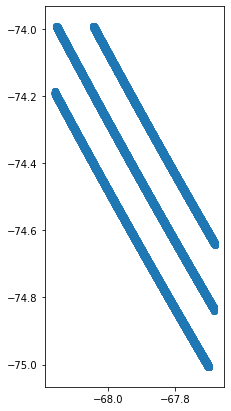

In [14]:
gdf.plot()

In [15]:
import georasters as grs
# Get the DEM
dem = grs.from_file(f'{dem_folder}/{dem_tif}')
def getPixVal(geom):
    #dem.map_pixel(x, y)
    coords = geom.coords[0]
    x, y = coords
    return(dem.map_pixel(x, y))

In [16]:
# proj4 = '+proj=stere +lat_0=-90 +lat_ts=-71 +lon_0=0 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs' #rema 
# proj4 = '+proj=stere +lat_0=90 +lat_ts=70 +lon_0=-45 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs' #arcticDEM
# gdf = gdf.to_crs({'init': 'epsg:4326'}) #change to lat/longitude
proj4 = dem.projection.ExportToProj4() # but there is extra space at the end
gdf1 = gdf.to_crs(proj4) #Without projecting to same crs as DEM, cant extract elevation from dEM

gdf1['dem'] = gdf1.geometry.apply(getPixVal)
# gdf = gdf.iloc[6:-10]
gdf1['dif'] = gdf1.h_li-gdf1.dem

In [17]:
gdf1.head()

,t_dt,h_li,q_flag,strip,geometry,dem,dif
0,2018-12-14 17:39:53.352000,1508.878784,0,gt1l,POINT (-1515533.830 621493.627),1511.755859,-2.877075
1,2018-12-14 17:39:53.354000,1508.894043,0,gt1l,POINT (-1515552.950 621498.356),1511.888428,-2.994385
2,2018-12-14 17:39:53.357000,1508.947998,0,gt1l,POINT (-1515572.072 621503.088),1511.749512,-2.801514
3,2018-12-14 17:39:53.360000,1509.036133,0,gt1l,POINT (-1515591.191 621507.816),1511.958618,-2.922485
4,2018-12-14 17:39:53.363000,1509.118652,0,gt1l,POINT (-1515610.314 621512.536),1511.996216,-2.877563


In [18]:
# Try and Compare the same with Xarray

In [19]:
from giuh_helpers import tic, toc

In [20]:
tic()
gdf1['dem'] = gdf1.geometry.apply(getPixVal)
toc()

Elapsed time is 3.160 seconds.


'Elapsed time is 3.160 seconds.'

In [ ]:
tic()
gdf1['dem_x'] = gdf1.geometry.apply(getPixVal2)
toc()

In [63]:
# Convert back to lat-lon
gdf1 = gdf1.to_crs({'init': 'epsg:4326'})


In [73]:
gdf1['lon'] = gdf1.geometry.x
gdf1['lat'] = gdf1.geometry.y

In [74]:
# These are edge of DEMs so basically no data
gdf2 = gdf1[gdf1.dem!=0] 

In [75]:
# dem.plot()

In [21]:
gdf.crs

{'init': 'epsg:4326'}

In [23]:
# use xarray only for visualization
da = xr.open_rasterio(f'{dem_folder}/{dem_tif}') #, chunks={'x':2**11, 'y':2**11}

# da = xr.open_rasterio(f'{dem_folder}/{ortho_tif}')
nodata_value = da.attrs['nodatavals'][0]
da.data[da.data==nodata_value] = np.nan
print(nodata_value)

-9999.0


In [24]:
gdf1.iloc[1].geometry.x, gdf1.iloc[1].geometry.y

(-1515552.9501334315, 621498.3556149905)

In [25]:
# da.plot.imshow(cmap='gist_earth')

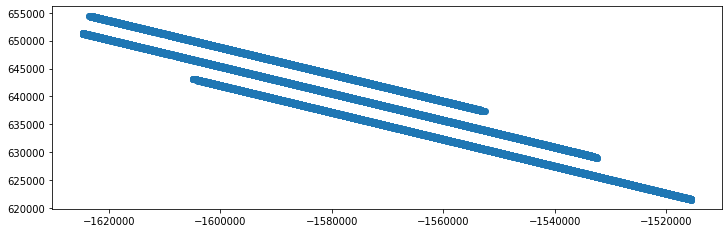

In [26]:
gdf1.plot()

In [27]:
# out = da.interp(x = gdf1.geometry.x, y=gdf1.geometry.y)

In [28]:
idx = 0
out = da.sel(x = gdf1.geometry.x[idx], y=gdf1.geometry.y[idx], method='nearest')
out

<xarray.DataArray (band: 1)>
array([1511.7559], dtype=float32)
Coordinates:
  * band     (band) int64 1
    y        float64 6.215e+05
    x        float64 -1.516e+06
Attributes:
    transform:      (2.0, 0.0, -1624700.0, 0.0, -2.0, 664424.0)
    crs:            +init=epsg:3031
    res:            (2.0, 2.0)
    is_tiled:       1
    nodatavals:     (-9999.0,)
    scales:         (1.0,)
    offsets:        (0.0,)
    AREA_OR_POINT:  Area

In [29]:
def getPixVal2(pt):
    #x, y = pt.coords[:][0]
    out = da.sel(x = pt.x, y=pt.y, method='nearest')
    return out.values[0]

In [30]:
pt = gdf1.geometry.iloc[0]
pt.x, pt.y

(-1515533.8295506996, 621493.6274036099)

In [31]:
# da.sel(x = pt.x, y=pt.y, method='nearest')

In [32]:
# print(gdf1.geometry.iloc[0].)

In [33]:
# gdf1.iloc[0].geometry.xy

In [34]:
# x, y = pt.coords[:][0]

In [35]:
pt = gdf1.geometry.iloc[0].xy
type(pt)

tuple

In [36]:
gdf1['dem_x'] = gdf1.geometry.apply(getPixVal2)

In [37]:
(gdf1.dem - gdf1.dem_x).min(), (gdf1.dem - gdf1.dem_x).max()

(0.0, 0.0)

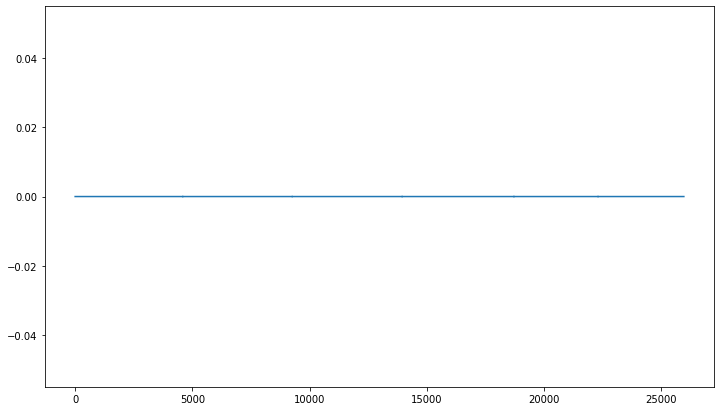

In [38]:
(gdf1.dem - gdf1.dem_x).plot()

In [39]:
gdf1.head()

,t_dt,h_li,q_flag,strip,geometry,dem,dif,dem_x
0,2018-12-14 17:39:53.352000,1508.878784,0,gt1l,POINT (-1515533.830 621493.627),1511.755859,-2.877075,1511.755859
1,2018-12-14 17:39:53.354000,1508.894043,0,gt1l,POINT (-1515552.950 621498.356),1511.888428,-2.994385,1511.888428
2,2018-12-14 17:39:53.357000,1508.947998,0,gt1l,POINT (-1515572.072 621503.088),1511.749512,-2.801514,1511.749512
3,2018-12-14 17:39:53.360000,1509.036133,0,gt1l,POINT (-1515591.191 621507.816),1511.958618,-2.922485,1511.958618
4,2018-12-14 17:39:53.363000,1509.118652,0,gt1l,POINT (-1515610.314 621512.536),1511.996216,-2.877563,1511.996216


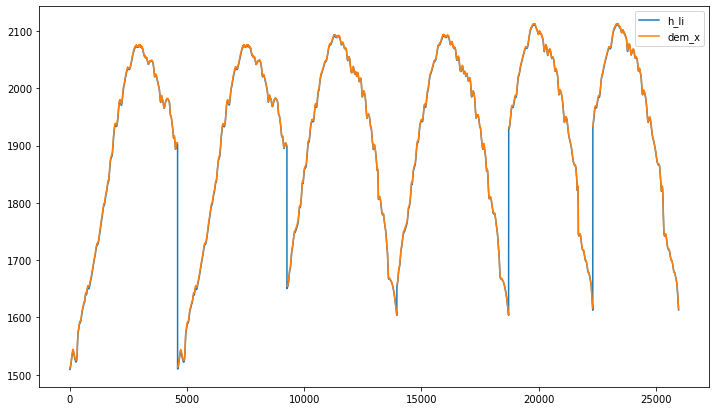

In [40]:
# gdf1.dif.plot(kind='hist', bins=100)
gdf1[['h_li', 'dem_x']].plot()

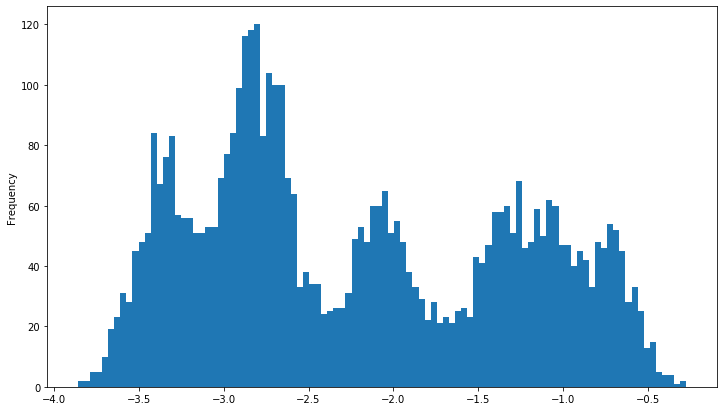

In [41]:
(gdf1.h_li - gdf1.dem_x)[gdf1.strip=='gt1l'].plot(kind='hist', bins=100)

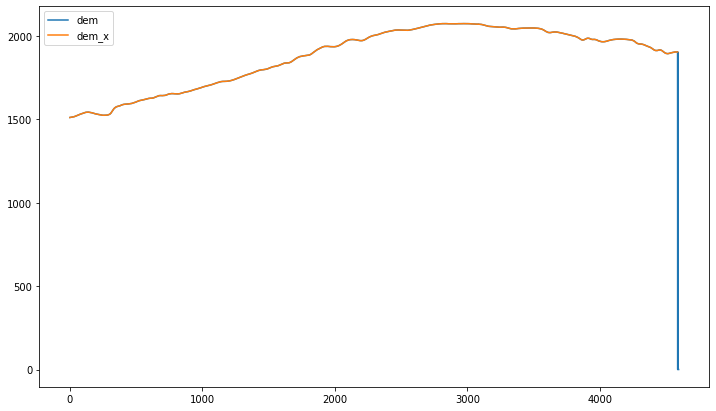

In [42]:
gdf1[gdf1.strip=='gt1l'][['dem', 'dem_x']].plot(subplots=False);

In [43]:
gdf1[np.isnan(gdf1.dem_x)]

,t_dt,h_li,q_flag,strip,geometry,dem,dif,dem_x
4587,2018-12-14 17:40:06.375000,1903.190186,0,gt1l,POINT (-1604091.425 642893.395),0.0,1903.190186,NaN
4589,2018-12-14 17:40:06.381000,1903.048706,0,gt1l,POINT (-1604129.795 642902.646),0.0,1903.048706,NaN
4590,2018-12-14 17:40:06.384000,1903.011963,0,gt1l,POINT (-1604148.987 642907.245),0.0,1903.011963,NaN
4591,2018-12-14 17:40:06.387000,1902.885010,0,gt1l,POINT (-1604168.180 642911.798),0.0,1902.885010,NaN
4592,2018-12-14 17:40:06.390000,1902.868164,0,gt1l,POINT (-1604187.400 642916.316),0.0,1902.868164,NaN
4593,2018-12-14 17:40:06.392000,1902.779419,0,gt1l,POINT (-1604206.615 642920.824),0.0,1902.779419,NaN
4594,2018-12-14 17:40:06.395000,1902.687256,0,gt1l,POINT (-1604225.828 642925.335),0.0,1902.687256,NaN
9253,2018-12-14 17:40:06.836000,1898.627930,0,gt1r,POINT (-1604758.287 643159.151),0.0,1898.627930,NaN
9254,2018-12-14 17:40:06.839000,1898.443726,0,gt1r,POINT (-1604777.487 643163.716),0.0,1898.443726,NaN
9255,2018-12-14 17:40:06.842000,1898.252197,0,gt1r,POINT (-1604796.686 643168.290),0.0,1898.252197,NaN


In [44]:
gdf1.geometry.x.iloc[0], gdf1.geometry.y.iloc[0]

(-1515533.8295506996, 621493.6274036099)

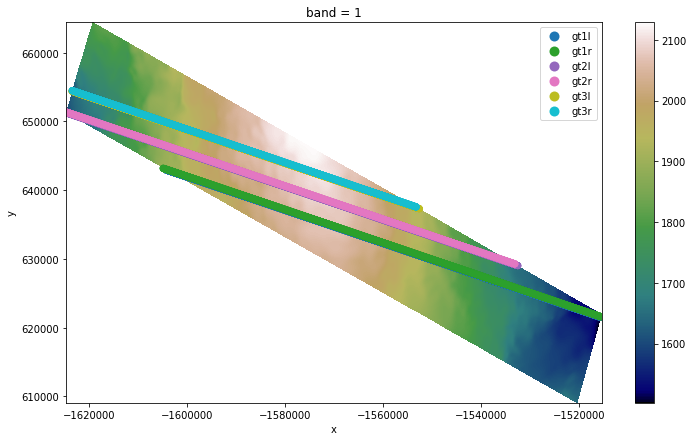

In [19]:
# To plot icesat and dem together, convert to common coordinate system
proj4 = '+proj=stere +lat_0=-90 +lat_ts=-71 +lon_0=0 +k=1 +x_0=0 +y_0=0 +datum=WGS84 +units=m +no_defs' #rema 
gdf_proj = gdf.to_crs(proj4)
ax = gdf_proj.plot(column='strip', legend=True)
da.sel(band=1).plot.imshow(ax=ax, cmap='gist_earth')
# plt.title('ATL08 over the REMA DEM')

In [77]:
gdf2 = gdf2.reset_index(drop = True)

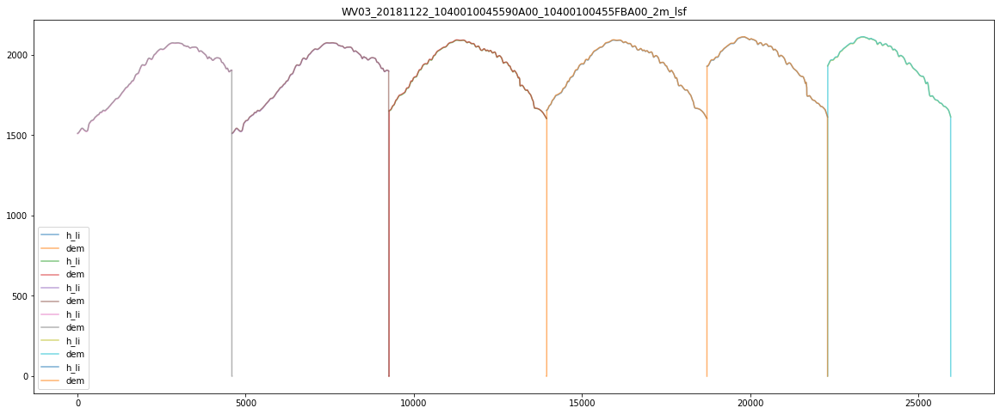

In [78]:
gtls = list(gdf2.strip.value_counts().index) #['gt1l', 'gt1r','gt2l', 'gt2r', 'gt3l','gt3r']
# gtl = gtls[2]
fig, ax = plt.subplots(figsize=(20, 8))
for gtl in gtls:
    gdf1[gdf1.strip==gtl][['h_li', 'dem']].iloc[1:-1].plot(style='-', alpha=.6, title=strip, ax=ax);

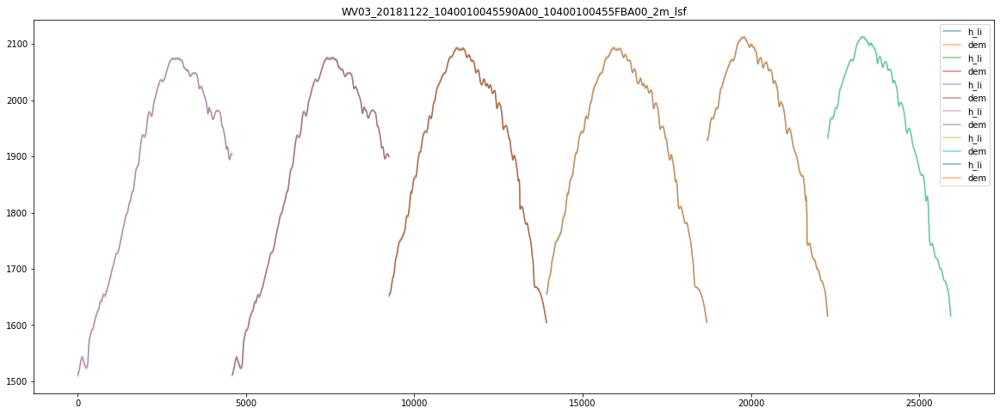

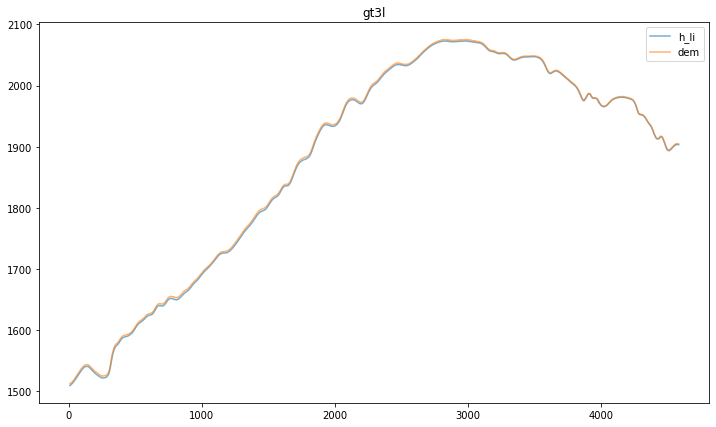

In [26]:
gdf1[gdf1.strip=='gt1l'].reset_index()[['h_li', 'dem']].iloc[10:-10].plot(style='-', alpha=.6, title=gtl)

In [79]:
# len(gtls)
gtls

['gt2r', 'gt2l', 'gt1r', 'gt1l', 'gt3r', 'gt3l']

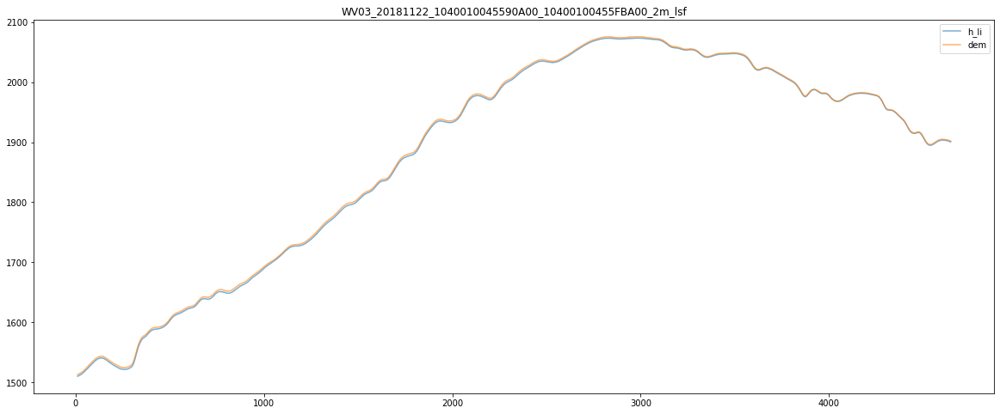

In [80]:
# gdf[['h_li', 'dem']].plot()
fig, ax = plt.subplots(figsize=(20, 8))
# gdf2[gdf2.strip=='gt1l'][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax
gdf2[gdf2.strip=='gt1r'][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax

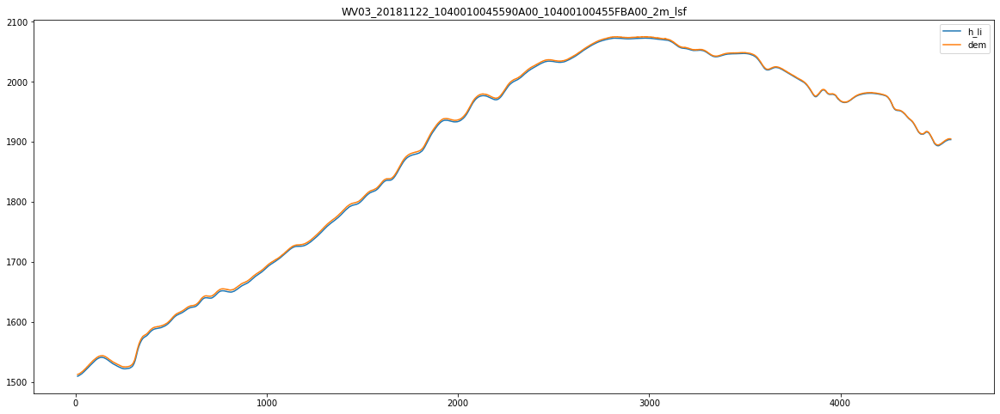

In [81]:
fig, ax = plt.subplots(figsize=(20, 8))
gdf2[gdf2.strip=='gt1l'][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', title=strip, ax=ax); #, ax=ax
# gdf[gdf.strip=='gt1r'][['h_li', 'dem']].reset_index(drop=True).iloc[10:-10].plot(style='-', alpha=.6, title=strip, ax=ax); #, ax=ax

In [82]:
# gdf0[gdf0.strip=='gt1l'].reset_index(drop=True)

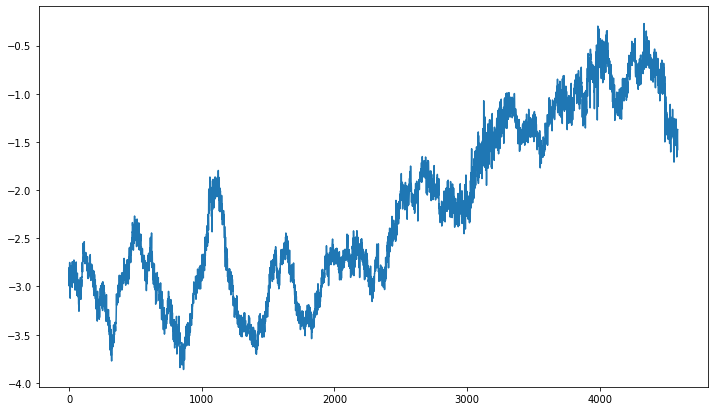

In [83]:
gdf2[gdf2.strip=='gt1l'].dif.plot()

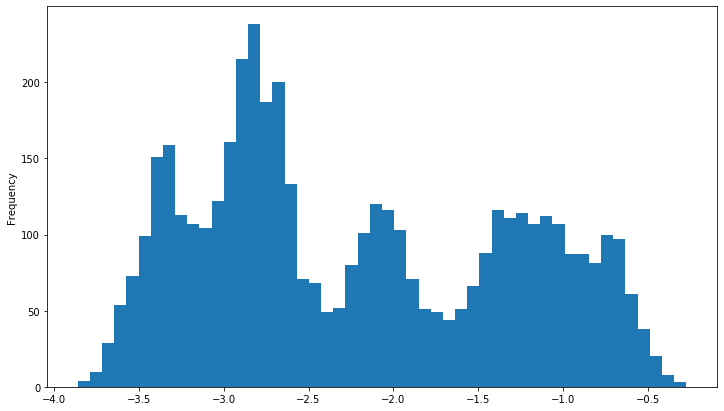

In [84]:
gdf2[gdf2.strip=='gt1l'].dif.plot(kind='hist', bins=50)

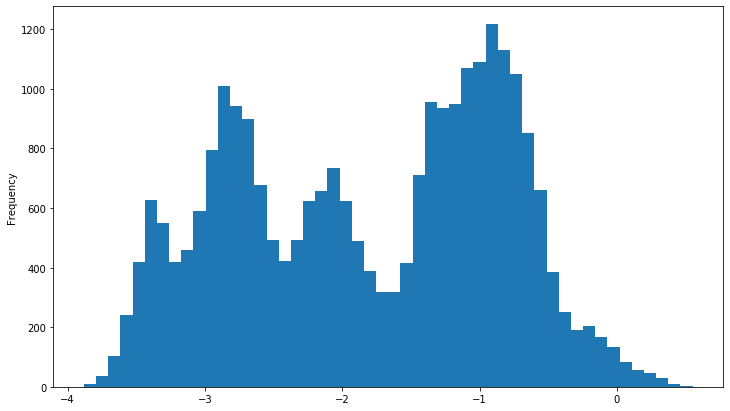

In [85]:
gdf2.dif.plot(kind='hist', bins=50)

In [86]:
gdf2.strip.value_counts()

gt2r    4763
gt2l    4679
gt1r    4658
gt1l    4588
gt3r    3657
gt3l    3584
Name: strip, dtype: int64

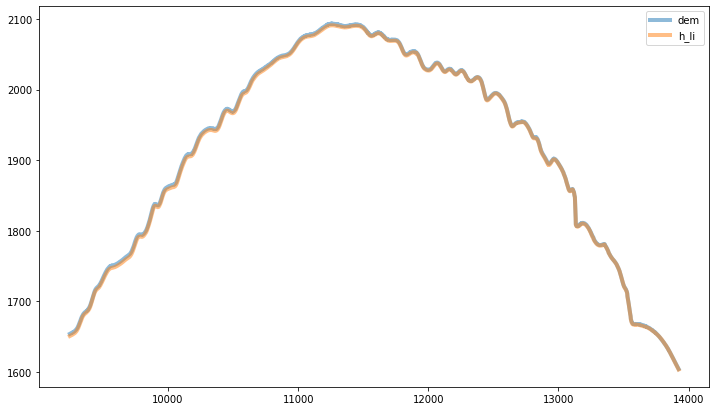

In [87]:
gtl = 'gt2'
ax = gdf2[gdf2.strip==f'{gtl}l'][['dem','h_li']].plot(lw=4, alpha=.5)
# gdf2[gdf2.strip==f'{gtl}r'][['h_li', 'dem']].plot(ax = ax)

In [88]:
#Make dataframe for plotting using hvplot
df2 = pd.DataFrame(gdf1)

In [89]:
gdf1

,t_dt,h_li,q_flag,strip,geometry,dem,dif,lon,lat
0,2018-12-14 17:39:53.352000,1508.878784,0,gt1l,POINT (-67.70233 -75.00694),1511.755859,-2.877075,-67.702333,-75.006944
1,2018-12-14 17:39:53.354000,1508.894043,0,gt1l,POINT (-67.70243 -75.00677),1511.888428,-2.994385,-67.702434,-75.006768
2,2018-12-14 17:39:53.357000,1508.947998,0,gt1l,POINT (-67.70253 -75.00659),1511.749512,-2.801514,-67.702535,-75.006591
3,2018-12-14 17:39:53.360000,1509.036133,0,gt1l,POINT (-67.70264 -75.00641),1511.958618,-2.922485,-67.702635,-75.006415
4,2018-12-14 17:39:53.363000,1509.118652,0,gt1l,POINT (-67.70274 -75.00624),1511.996216,-2.877563,-67.702736,-75.006238
...,...,...,...,...,...,...,...,...,...
25965,2018-12-14 17:40:09.758000,1615.464844,0,gt3r,POINT (-68.04264 -73.99137),1616.190186,-0.725342,-68.042639,-73.991367
25966,2018-12-14 17:40:09.760000,1614.878174,0,gt3r,POINT (-68.04273 -73.99119),1615.451660,-0.573486,-68.042734,-73.991191
25967,2018-12-14 17:40:09.763000,1614.319702,0,gt3r,POINT (-68.04283 -73.99101),0.000000,1614.319702,-68.042830,-73.991014
25968,2018-12-14 17:40:09.766000,1613.700073,0,gt3r,POINT (-68.04293 -73.99084),0.000000,1613.700073,-68.042928,-73.990838


In [145]:
first = df2[df2.strip=='gt2l'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=700, s=5, alpha=.9) 
second = df2[df2.strip=='gt2r'].hvplot(x='lon', y='dem', kind='scatter', height=450, width=700, s=1, alpha=.9, ylim=(1400, 2200))# ylim=(1200, 2200) 
first * second

:Overlay
   .Scatter.I  :Scatter   [lon]   (h_li)
   .Scatter.II :Scatter   [lon]   (dem)

In [153]:
bounds = (1400, 2200)

In [161]:
# one = df2[df2.strip.isin(['gt1l', 'gt1r'])].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=900, s=5, alpha=.9, by='strip') 
a1 = df2[df2.strip=='gt2l'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=800, s=30, alpha=.5, ylim=bounds).relabel('ATL06')
a2 = df2[df2.strip=='gt2l'].hvplot(x='lon', y='dem', kind='scatter', height=450, width=800, s=1, alpha=.9, ylim=bounds, ylabel='Elevation (meter)', xlabel='Longitude').relabel('DEM')
a1*a2 #+ a3*a4


:Overlay
   .Scatter.ATL06 :Scatter   [lon]   (h_li)
   .Scatter.DEM   :Scatter   [lon]   (dem)

In [211]:
a3 = df2[df2.strip=='gt2r'].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=800, s=40, alpha=.5, ylim=bounds).relabel('ATL06')
a4 = df2[df2.strip=='gt2r'].hvplot(x='lon', y='dem', kind='scatter', height=350, width=800, s=1, alpha=.9, ylim=bounds, ylabel='Elevation (meter)', xlabel='Longitude').relabel('DEM')
a3*a4

:Overlay
   .Scatter.ATL06 :Scatter   [lon]   (h_li)
   .Scatter.DEM   :Scatter   [lon]   (dem)

In [202]:
df2[df2.strip=='gt2r'].hvplot(x='lon', y='dif', kind='scatter', height=200, width=700, s=.15,  ylim=(-4,3), ylabel='meter', xlabel='Longitude')#.relabel('Elevation Difference') #title='Elevation Difference between ATL06 and REMA'

:Scatter   [lon]   (dif)

In [207]:
gdf2.dif.std()

0.9702196892382353

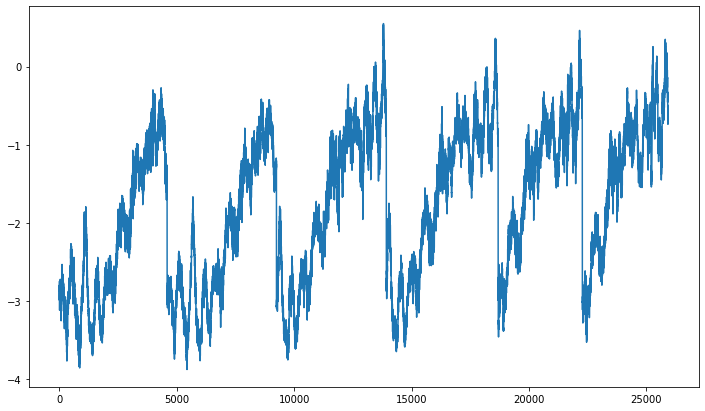

In [209]:
gdf2.dif.plot()

In [162]:
a1*a2+a3*a4

:Layout
   .Overlay.I  :Overlay
      .Scatter.ATL06 :Scatter   [lon]   (h_li)
      .Scatter.DEM   :Scatter   [lon]   (dem)
   .Overlay.II :Overlay
      .Scatter.ATL06 :Scatter   [lon]   (h_li)
      .Scatter.DEM   :Scatter   [lon]   (dem)

In [113]:
first = df2[df2.strip.isin(['gt1l', 'gt1r'])].hvplot(x='lon', y='h_li', kind='scatter', height=450, width=900, s=5, alpha=.9, by='strip') 
second = df2[df2.strip.isin(['gt1l', 'gt1r'])].hvplot(x='lon', y='dem', kind='scatter', height=450, width=900, s=1, alpha=.9, by='strip', ylim=(1400, 2200))# ylim=(1200, 2200) 
first * second

:Overlay
   .NdOverlay.I  :NdOverlay   [strip]
      :Scatter   [lon]   (h_li)
   .NdOverlay.II :NdOverlay   [strip]
      :Scatter   [lon]   (dem)

In [111]:
df2[df2.strip.isin(['gt1l', 'gt1r'])]

,t_dt,h_li,q_flag,strip,geometry,dem,dif,lon,lat
0,2018-12-14 17:39:53.352000,1508.878784,0,gt1l,POINT (-67.70233 -75.00694),1511.755859,-2.877075,-67.702333,-75.006944
1,2018-12-14 17:39:53.354000,1508.894043,0,gt1l,POINT (-67.70243 -75.00677),1511.888428,-2.994385,-67.702434,-75.006768
2,2018-12-14 17:39:53.357000,1508.947998,0,gt1l,POINT (-67.70253 -75.00659),1511.749512,-2.801514,-67.702535,-75.006591
3,2018-12-14 17:39:53.360000,1509.036133,0,gt1l,POINT (-67.70264 -75.00641),1511.958618,-2.922485,-67.702635,-75.006415
4,2018-12-14 17:39:53.363000,1509.118652,0,gt1l,POINT (-67.70274 -75.00624),1511.996216,-2.877563,-67.702736,-75.006238
...,...,...,...,...,...,...,...,...,...
9255,2018-12-14 17:40:06.842000,1898.252197,0,gt1r,POINT (-68.16014 -74.18507),0.000000,1898.252197,-68.160140,-74.185069
9256,2018-12-14 17:40:06.845000,1898.076538,0,gt1r,POINT (-68.16024 -74.18489),0.000000,1898.076538,-68.160235,-74.184892
9257,2018-12-14 17:40:06.847000,1897.864746,0,gt1r,POINT (-68.16033 -74.18472),0.000000,1897.864746,-68.160329,-74.184716
9258,2018-12-14 17:40:06.850000,1897.681274,0,gt1r,POINT (-68.16042 -74.18454),0.000000,1897.681274,-68.160422,-74.184539


In [91]:
first = df2.hvplot(y='lon', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
second = df2.hvplot(y='lon', x='dem', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
first * second

:NdLayout   [strip]
   :Overlay
      .Scatter.I  :Scatter   [h_li]   (lon)
      .Scatter.II :Scatter   [dem]   (lon)

In [92]:
third = df2.hvplot(y='lat', x='h_li', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
fourth = df2.hvplot(y='lat', x='dem', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True) 
third * fourth

:NdLayout   [strip]
   :Overlay
      .Scatter.I  :Scatter   [h_li]   (lat)
      .Scatter.II :Scatter   [dem]   (lat)

In [93]:
df2.hvplot(y='lon', x='dem', kind='scatter', width=350, height=600, by='strip', s=5, alpha=.9, xlabel='meters', subplots=True)

:NdLayout   [strip]
   :Scatter   [dem]   (lon)

In [94]:
df2.hvplot(y='h_li')

:Curve   [index]   (h_li)

In [95]:
# df2 = gdf2.drop('geometry', axis=1)

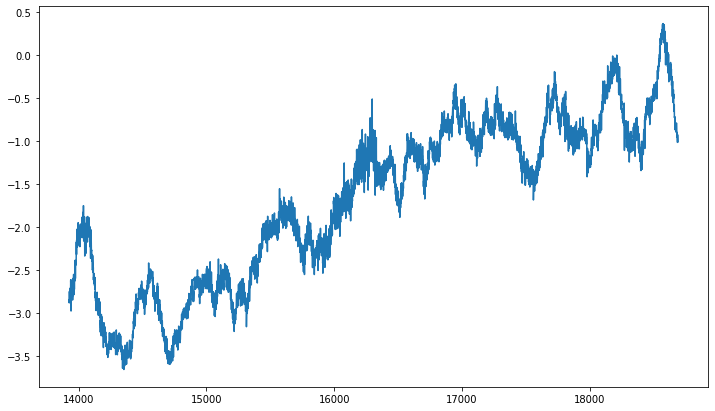

In [97]:
gdf2[gdf2.strip==f'{gtl}r'].dif.plot()

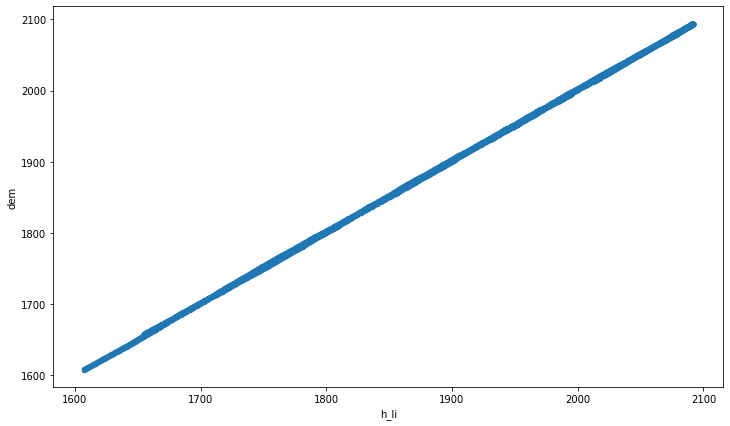

In [98]:
gdf2[gdf2.strip==f'{gtl}r'][['h_li', 'dem']].iloc[2:-10].plot(kind='scatter', x=0, y=1)